# Exploratory Data Analysis of Sentinel-2 Images of Part of Iwo Local Government, Osun State Nigeria.

## Load Libraries

In [11]:
# data manipulation
import pandas as pd
import numpy as np

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# geospatial libraries
import rasterio
import geopandas as gpd
import earthpy.plot as ep
from rasterio.plot import reshape_as_raster, reshape_as_image
import folium

In [13]:
# Define File Paths
s2_img = "C:/Users/DELL/Downloads/RS&GIS_Stuff/Agriculture Land Conservation/Processed Data/image2.tif"
training_data = 'C:/Users/DELL/Downloads/RS&GIS_Stuff/Agriculture Land Conservation/Processed Data/training.shp'
validation_data = 'C:/Users/DELL/Downloads/RS&GIS_Stuff/Agriculture Land Conservation/Processed Data/validation.shp'
results = 'C:/Users/DELL/Downloads/RS&GIS_Stuff/Agriculture Land Conservation/Results/'

In [ ]:
# define variables
class_name = ['Water Bodies', 'Trees', 'Crops', 'Built up Areas',
             'Bareland', 'Rangeland']
lulc_colors = {
    'Water Bodies': '#0000FF',     # Blue
    'Trees': '#228B22',           # Forest Green
    'Crops': '#FFD700',          # Golden Yellow
    'Built up Areas': '#FF0000',  # Red
    'Bareland': '#DEB887',       # Burlywood (Light Brown)
    'Rangeland': '#98FB98'       # Pale Green
}

bands = [
        'B2_1', 'B3_1', 'B4_1', 'B8_1', 'B','B12_1' ,
    'B22', 'B3_2', 'B4_2', 'B8_2', 'B11_2','B12_2',
    'B2_3', 'B3_3', 'B4_3', 'B8_3', 'B11_3','B12_3',
     'B2_4', 'B3_4', 'B4_4', 'B8_4', 'B11_4','B12_4',
     'B2_5', 'B3_5', 'B4_5', 'B8_5', 'B11_5', 'B12_5',
     'B2_6', 'B3_6', 'B4_6', 'B8_6', 'B11_6', 'B12_6',
     'B2_7', 'B3_7', 'B4_7', 'B8_7', 'B11_7', 'B12_7',
     'B2_8', 'B3_8', 'B4_8', 'B8_8', 'B11_8', 'B12_8',
     'B2_9', 'B3_9', 'B4_9', 'B8_9', 'B11_9', 'B12_9',
        ]

## Load data and Visualize

In [9]:
# load the raster data
src = rasterio.open(s2_img)

# read the data to 3 dimensions array
stacked = src.read()
stacked.shape

(54, 1912, 2211)

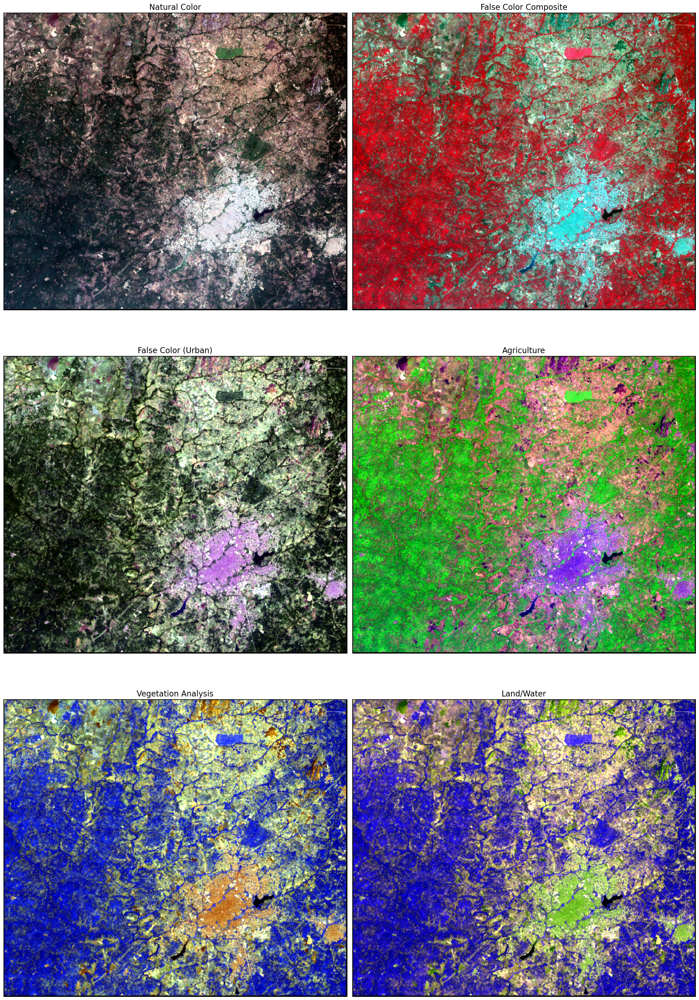

In [45]:
fig, axes = plt.subplots(3, 2, figsize=(20, 30))
axes = axes.flatten()  # Flatten the 2D array of axes for easier indexing

plot_params = [
    ((2,1,0), 'Natural Color'),
    ((3,2,1), 'False Color Composite'),
    ((5,4,2), 'False Color (Urban)'),
    ((4,3,0), 'Agriculture'),
    ((5,4,3), 'Vegetation Analysis'),
    ((4,5,3), 'Land/Water')
]

for ax, (rgb, title) in zip(axes, plot_params):
    ep.plot_rgb(arr=stacked, rgb=rgb, stretch=True, ax=ax)
    ax.set_title(title, fontsize=16)
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.tight_layout()
plt.savefig(f'{results}images/raster_band.png')
plt.show()

In [66]:
# read the training data shapefile into a GeoDataFrame using geopandas and renames a column
training_df = gpd.read_file(training_data)
training_df.rename(columns={'class1':'class'}, inplace=True)
training_df.head(5)

,id,class,geometry
0,0,4,POINT (626441.114 842765.426)
1,2,6,POINT (630334.267 852004.629)
2,3,2,POINT (636684.337 845343.263)
3,4,4,POINT (628254.389 845344.339)
4,8,6,POINT (621676.204 842991.831)


In [67]:
# Groups training points by class to compute mean values
train_pts.groupby('class').mean()

,B2_1,B3_1,B4_1,B8_1,B,B12_1,B22,B3_2,B4_2,B8_2,...,B4_8,B8_8,B11_8,B12_8,B2_9,B3_9,B4_9,B8_9,B11_9,B12_9
class,,,,,,,,,,,,,,,,,,,,,
1,1176.750000,1060.750000,868.750000,914.750000,517.000000,306.500000,1935.250000,1822.000000,1790.250000,2047.500000,...,1162.500000,1466.250000,1196.750000,738.750000,328.750000,519.500000,548.000000,544.500000,723.250000,502.000000
2,1144.092773,1001.272827,859.107544,2184.343994,1833.552368,980.176086,1866.228516,1710.228516,1638.021484,2161.438232,...,1095.736572,2290.158691,2105.111572,1294.932739,277.620972,605.432800,560.446228,2924.188232,2119.317139,1188.362915
3,1235.571411,1145.464233,1189.214233,2169.714355,2577.107178,1682.464233,1874.642822,1744.214233,1764.678589,2163.392822,...,1421.107178,2315.857178,2891.214355,2136.892822,448.714294,838.107117,982.107117,2594.214355,2807.964355,1956.964233
4,1317.527954,1231.416016,1296.027954,2018.832031,2443.884033,1799.112061,1931.995972,1813.751953,1843.423950,2114.135986,...,1481.680054,2163.191895,2625.843994,2104.679932,620.388000,985.927979,1156.619995,2501.728027,2683.343994,2041.839966
6,1201.722412,1083.146240,1078.786011,2050.372803,2406.271240,1521.379272,1878.264771,1732.879272,1717.830566,2112.771240,...,1278.661011,2204.133545,2612.836914,1838.313599,380.949158,743.326294,804.449158,2692.203369,2567.438477,1644.349609


In [68]:
# read the validation data shapefile into a GeoDataFrame using geopandas and renames a column
val_df = gpd.read_file(validation_data)
val_df.label.astype('int')
val_df.head(5)

,id,label,geometry
0,1,2,POINT (620242.504 846678.552)
1,5,2,POINT (625634.429 852588.704)
2,6,2,POINT (622460.011 850409.576)
3,7,2,POINT (618678.363 849433.901)
4,10,6,POINT (624781.531 844402.492)


# Sampling, Exploration, and Correlation

In [70]:
# Sample raster using the point dataset
coord_list = [(x,y) for x,y in zip(training_df['geometry'].x,training_df['geometry'].y)]
training_df['raster'] = [x for x in src.sample(coord_list)]

# Sampling Raster for Training Data
training_df[bands] = pd.DataFrame(training_df['raster'].tolist(), index=training_df.index)
train_pts = training_df.drop(columns=['raster','geometry', 'id'])
train_pts.head(5).T

,0,1,2,3,4
class,4.0,6.0,2.0,4.0,6.0
B2_1,1609.0,1106.0,1124.0,1240.0,1202.0
B3_1,1523.0,965.0,960.0,1125.0,1089.0
B4_1,1689.0,828.0,768.0,1090.0,1081.0
B8_1,2185.0,2226.0,2163.0,2071.0,2015.0
B,3043.0,1824.0,1427.0,2151.0,2348.0
B12_1,2481.0,1044.0,663.0,1554.0,1524.0
B22,1960.0,1807.0,1829.0,1925.0,1873.0
B3_2,1826.0,1669.0,1676.0,1814.0,1721.0
B4_2,1844.0,1616.0,1583.0,1831.0,1670.0


In [71]:
# ampling Raster for Validation Data
coord_list = [(x,y) for x,y in zip(val_df['geometry'].x,val_df['geometry'].y)]
val_df['raster'] = [x for x in src.sample(coord_list)]
val_df[bands] = pd.DataFrame(val_df['raster'].tolist(), index=val_df.index)
val_pts = val_df.drop(columns=['raster','geometry', 'id'])
val_pts.head(5).T

,0,1,2,3,4
label,2.0,2.0,2.0,2.0,6.0
B2_1,1140.0,1183.0,1116.0,1113.0,1166.0
B3_1,981.0,1064.0,952.0,946.0,1019.0
B4_1,823.0,998.0,793.0,738.0,947.0
B8_1,2058.0,2365.0,1918.0,2109.0,1838.0
B,1503.0,2064.0,1725.0,1658.0,2130.0
B12_1,741.0,1200.0,888.0,779.0,1262.0
B22,1854.0,1843.0,1852.0,1838.0,1937.0
B3_2,1708.0,1684.0,1682.0,1666.0,1774.0
B4_2,1594.0,1620.0,1577.0,1552.0,1733.0


In [74]:
train_pts.describe().T

,count,mean,std,min,25%,50%,75%,max
class,1498.0,3.610147,1.771957,1.0,2.00,3.0,6.00,6.0
B2_1,1498.0,1192.195557,87.402061,0.0,1135.00,1172.0,1226.00,1645.0
B3_1,1498.0,1067.606201,114.156197,0.0,988.00,1040.0,1118.00,1664.0
B4_1,1498.0,1006.690918,224.842087,0.0,824.00,965.0,1146.00,1857.0
B8_1,1498.0,2109.325684,249.508469,0.0,1970.00,2096.0,2249.75,2926.0
B,1498.0,2124.525391,449.208710,0.0,1742.75,2104.5,2457.75,3525.0
B12_1,1498.0,1297.707642,462.646332,0.0,886.00,1249.0,1636.00,3001.0
B22,1498.0,1880.090088,60.633217,0.0,1853.00,1874.0,1909.75,1977.0
B3_2,1498.0,1734.419922,66.501343,0.0,1700.00,1724.5,1767.50,1882.0
B4_2,1498.0,1699.065430,101.204010,0.0,1630.00,1693.0,1751.00,1954.0


In [75]:
# Get a sample so we can speed up expensive visualizations
sampleDf = train_pts.sample(frac=0.1)
sampleDf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150 entries, 959 to 644
Data columns (total 55 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   class   150 non-null    int64  
 1   B2_1    150 non-null    float32
 2   B3_1    150 non-null    float32
 3   B4_1    150 non-null    float32
 4   B8_1    150 non-null    float32
 5   B       150 non-null    float32
 6   B12_1   150 non-null    float32
 7   B22     150 non-null    float32
 8   B3_2    150 non-null    float32
 9   B4_2    150 non-null    float32
 10  B8_2    150 non-null    float32
 11  B11_2   150 non-null    float32
 12  B12_2   150 non-null    float32
 13  B2_3    150 non-null    float32
 14  B3_3    150 non-null    float32
 15  B4_3    150 non-null    float32
 16  B8_3    150 non-null    float32
 17  B11_3   150 non-null    float32
 18  B12_3   150 non-null    float32
 19  B2_4    150 non-null    float32
 20  B3_4    150 non-null    float32
 21  B4_4    150 non-null    float32
 22  B8_4 

## Exploratory Data Analysis

C:\Users\DELL\AppData\Local\Temp\ipykernel_6676\4286235440.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(x) for x in range(1, len(row)+1)])
C:\Users\DELL\AppData\Local\Temp\ipykernel_6676\4286235440.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(x) for x in range(1, len(row)+1)])
C:\Users\DELL\AppData\Local\Temp\ipykernel_6676\4286235440.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(x) for x in range(1, len(row)+1)])
C:\Users\DELL\AppData\Local\Temp\ipykernel_6676\4286235440.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(x) for x in ran

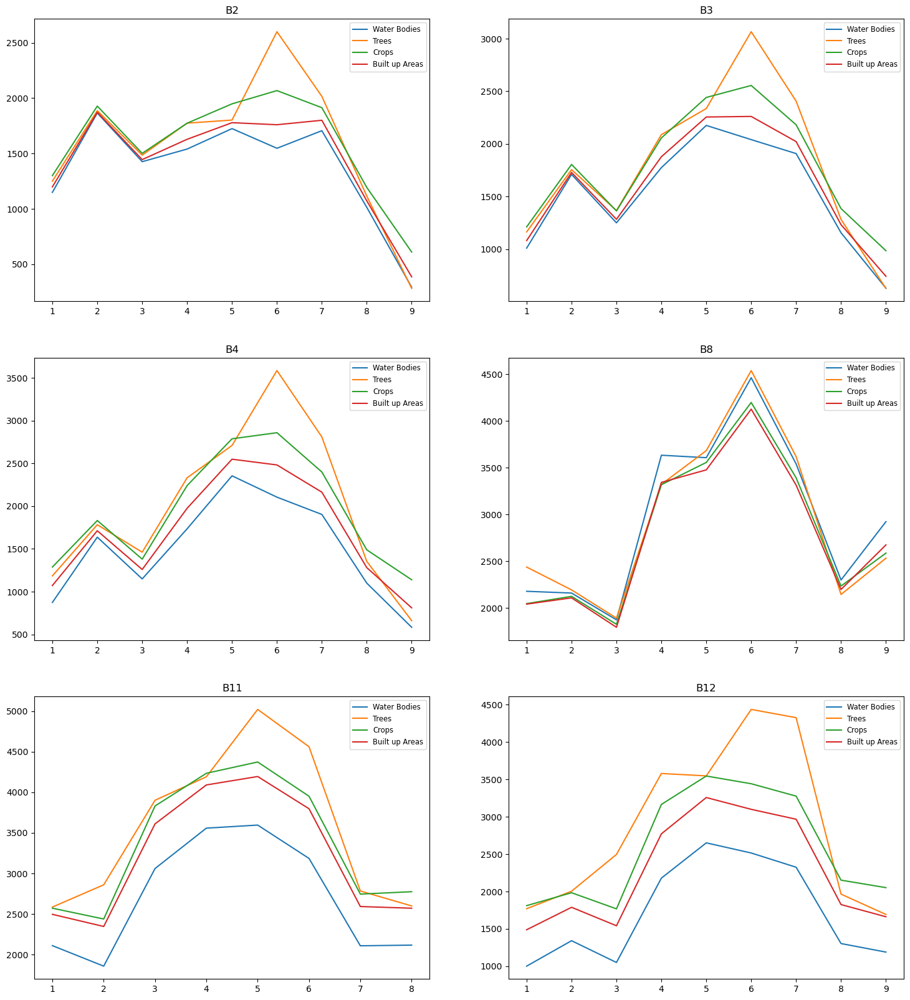

In [80]:
# Summarizes the training dataset, providing descriptive statistics (mean, standard deviation, etc.)
grouped_class = sampleDf.groupby('class').mean()
fig = plt.figure(figsize=(18,20))
band_no = ['B2', 'B3', 'B4', 'B8', 'B11', 'B12']
n=1

# Visualization of Band-Wise Distributions
for band in band_no:
    ax=fig.add_subplot(3,2,n)
    ax.title.set_text(band)
    band_val = grouped_class[grouped_class.columns[grouped_class.columns.to_series().str.contains(band)]]
    for index, row in band_val.iterrows():
        ax.plot(row)
    ax.set_xticklabels([str(x) for x in range(1, len(row)+1)])
    ax.legend(loc='best', fontsize='small', labels=class_name)
    n +=1

plt.savefig('C:/Users/DELL/Downloads/RS&GIS_Stuff/Agriculture Land Conservation/Results/images/class distibution.png')

In [81]:
# sns.pairplot(train_pts, hue='class',kind='reg')

### Correlation Calculation

In [85]:
# Correlation Calculation
corr = train_pts.corr()['class']
corr.to_csv(f"{results}csv/correlation.csv")
corr.head(10)

class    1.000000
B2_1     0.332780
B3_1     0.360288
B4_1     0.472765
B8_1    -0.240521
B        0.587782
B12_1    0.555543
B22      0.091109
B3_2     0.168666
B4_2     0.380518
Name: class, dtype: float64

In [86]:
# correlation table
train_pts.corr().style.background_gradient(cmap='viridis')

,class,B2_1,B3_1,B4_1,B8_1,B,B12_1,B22,B3_2,B4_2,B8_2,B11_2,B12_2,B2_3,B3_3,B4_3,B8_3,B11_3,B12_3,B2_4,B3_4,B4_4,B8_4,B11_4,B12_4,B2_5,B3_5,B4_5,B8_5,B11_5,B12_5,B2_6,B3_6,B4_6,B8_6,B11_6,B12_6,B2_7,B3_7,B4_7,B8_7,B11_7,B12_7,B2_8,B3_8,B4_8,B8_8,B11_8,B12_8,B2_9,B3_9,B4_9,B8_9,B11_9,B12_9
class,1.000000,0.332780,0.360288,0.472765,-0.240521,0.587782,0.555543,0.091109,0.168666,0.380518,-0.255004,0.580642,0.608673,0.217860,0.289762,0.479024,-0.265548,0.566790,0.591359,0.369411,0.371699,0.474265,-0.329702,0.598472,0.567893,0.224451,0.279457,0.458451,-0.238157,0.573297,0.607264,0.376054,0.404033,0.516622,-0.347970,0.629590,0.594095,0.379573,0.384426,0.510133,-0.282384,0.596765,0.592179,0.357481,0.375471,0.495743,-0.245482,0.635002,0.597220,0.324207,0.381203,0.422161,-0.266042,0.570249,0.507202
B2_1,0.332780,1.000000,0.972753,0.915116,-0.133047,0.689663,0.804229,0.635143,0.747513,0.857130,0.036416,0.596450,0.722561,0.768506,0.838173,0.848879,-0.111829,0.544503,0.688472,0.881198,0.878550,0.859766,-0.274224,0.648718,0.762403,0.619049,0.741949,0.820581,-0.008799,0.588855,0.724387,0.713785,0.776338,0.801062,-0.267830,0.609917,0.745865,0.806982,0.824678,0.804540,-0.181199,0.577409,0.713655,0.817066,0.835283,0.838559,-0.163980,0.614045,0.737732,0.770334,0.790116,0.794459,-0.359967,0.641346,0.750191
B3_1,0.360288,0.972753,1.000000,0.951143,-0.084642,0.735667,0.840552,0.530795,0.665759,0.822401,-0.007125,0.627994,0.753181,0.698639,0.801327,0.853293,-0.120130,0.578947,0.719461,0.868316,0.882172,0.876667,-0.276742,0.675991,0.788184,0.572826,0.700798,0.807319,-0.030766,0.612452,0.747858,0.719350,0.781991,0.814362,-0.292383,0.631242,0.767037,0.782254,0.820813,0.819589,-0.184985,0.606360,0.738661,0.800428,0.830852,0.854247,-0.169934,0.644428,0.764249,0.775857,0.811316,0.814711,-0.352788,0.666554,0.772002
B4_1,0.472765,0.915116,0.951143,1.000000,-0.223403,0.844704,0.928520,0.397214,0.545048,0.774514,-0.152781,0.705308,0.830680,0.590205,0.713729,0.855238,-0.249628,0.661732,0.797558,0.830835,0.836838,0.903750,-0.415446,0.759775,0.856249,0.517699,0.639266,0.811952,-0.155840,0.688911,0.823417,0.716754,0.767735,0.845928,-0.422075,0.710804,0.828392,0.759029,0.787941,0.857911,-0.315580,0.694365,0.812688,0.757106,0.789051,0.869449,-0.281064,0.731086,0.832888,0.747415,0.784915,0.829277,-0.429608,0.737826,0.818701
B8_1,-0.240521,-0.133047,-0.084642,-0.223403,1.000000,-0.111746,-0.251920,0.017019,-0.054553,-0.196973,0.552123,-0.129699,-0.267737,-0.001344,-0.058415,-0.216810,0.644843,-0.108045,-0.247135,-0.181220,-0.128243,-0.261569,0.750122,-0.125568,-0.244382,-0.159020,-0.186236,-0.275237,0.515078,-0.137779,-0.268774,-0.206130,-0.182539,-0.280748,0.666051,-0.134155,-0.243155,-0.188592,-0.140450,-0.256519,0.680814,-0.119315,-0.240461,-0.191523,-0.171857,-0.255973,0.679989,-0.146557,-0.259417,-0.244515,-0.190920,-0.280221,0.643002,-0.116959,-0.241366
B,0.587782,0.689663,0.735667,0.844704,-0.111746,1.000000,0.944557,0.270143,0.374340,0.607524,-0.113545,0.830871,0.859046,0.449576,0.545001,0.727005,-0.176689,0.811602,0.837304,0.647285,0.656079,0.750507,-0.327671,0.874280,0.844091,0.366317,0.462738,0.676210,-0.147263,0.812699,0.854044,0.605929,0.640014,0.733613,-0.318396,0.837033,0.826046,0.624963,0.643931,0.755885,-0.240239,0.840905,0.840726,0.558444,0.590589,0.712651,-0.170740,0.852942,0.828259,0.531970,0.608377,0.636481,-0.240366,0.813940,0.743988
B12_1,0.555543,0.804229,0.840552,0.928520,-0.251920,0.944557,1.000000,0.310898,0.449210,0.697474,-0.173571,0.784750,0.881644,0.502742,0.624314,0.805379,-0.259751,0.758826,0.861504,0.749896,0.752886,0.846306,-0.422966,0.838325,0.893425,0.448793,0.561013,0.761199,-0.183380,0.768007,0.874952,0.683287,0.722974,0.816896,-0.421214,0.789036,0.865711,0.703409,0.724229,0.826384,-0.325621,0.786959,0.869190,0.666881,0.697909,0.808064,-0.279258,0.809803,0.872032,0.673799,0.725875,0.769196,-0.383213,0.804360,0.829532
B22,0.091109,0.635143,0.530795,0.397214,0.017019,0.270143,0.310898,1.000000,0.950952,0.785259,0.395005,0.331844,0

## Save training and validation data as csv

In [87]:
train_pts.to_csv(f'{results}train_output.csv', index=False)
val_pts.to_csv(f'{results}validation_output.csv', index=False)